# Taller 2


Santiago Martínez Novoa - 202112020

David Alejandro Fuquen Florez - 202021113

## 0. Importación de librerías

In [1]:
# Data manipulation and analysis
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statistics
import scipy.stats as stats
from scipy.stats import ks_2samp, chi2_contingency

# Machine Learning
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import PolynomialFeatures, StandardScaler

# Model Interpretability
import shap
import lime
import lime.lime_tabular

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.feature_selection import SelectKBest, f_regression, RFE
import warnings
warnings.filterwarnings("ignore")

d:\CDA\Uniandes-Ciencia-Datos-Taller2\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1. Entendimiento y preparación de los datos

### 1.1. Exploración y descripción de los datos

En una primera fase de la exploración de los datos, es necesario revisar las características básicas del dataset, tales como el número de filas y columnas, los tipos de datos presentes en cada columna, la presencia de valores nulos o faltantes, y las estadísticas descriptivas de las variables numéricas. Esto permite obtener una visión general del conjunto de datos y dirigir las decisiones de limpieza y preprocesamiento.

In [2]:
df = pd.read_csv('data/apartamentos.csv')
df.head()

,_id,codigo,tipo_propiedad,tipo_operacion,precio_venta,area,habitaciones,banos,administracion,parqueaderos,...,vigilancia,coords_modified,localidad,barrio,estacion_tm_cercana,distancia_estacion_tm_m,is_cerca_estacion_tm,parque_cercano,distancia_parque_m,is_cerca_parque
0,66d86c7eceda690e85508760,4133491,APARTAMENTO,VENTA,339000000.0,76.0,3.0,2.0,300000.0,1.0,...,0.0,False,SUBA,URB. PICADELLY,Toberin - Foundever,1142.45,0,PARQUE VECINAL DESARROLLO CANTALEJO URBANIZACI...,426.09,1
1,66d86c7eceda690e85508761,3889852,APARTAMENTO,VENTA,223000000.0,63.0,3.0,2.0,NaN,0.0,...,0.0,False,USAQUEN,BARRANCAS PERLAS DEL NORTE,Mazurén,2384.89,0,PARQUE ZONAL ALTA BLANCA,472.47,1
2,66d86c7eceda690e85508762,4386770,APARTAMENTO,VENTA,440898168.0,54.0,3.0,2.0,305000.0,0.0,...,0.0,False,LOS MARTIRES,SAN VICTORINO,De La Sabana,232.22,1,PARQUE METROPOLITANO TERCER MILENIO,961.29,0
3,66d86c7eceda690e85508763,4210060,APARTAMENTO,VENTA,158000000.0,43.0,2.0,2.0,106600.0,0.0,...,0.0,False,SUBA,LA ESTRELLA II,Portal Suba,2275.08,0,PARQUE ZONAL LA GAITANA,539.98,0
4,66d86c7eceda690e85508764,4063762,APARTAMENTO,VENTA,222800000.0,48.0,3.0,2.0,151000.0,0.0,...,0.0,False,USAQUEN,HORIZONTES USAQUEN,Terminal,2099.16,0,PARQUE VECINAL DESARROLLO VERBENAL I,1661.14,0


In [3]:
print("El dataset tiene {} filas y {} columnas.".format(df.shape[0], df.shape[1]))

El dataset tiene 43013 filas y 46 columnas.


In [4]:
# Información básica del dataset
print('Dimensiones del dataset (filas, columnas):', df.shape)
print('\nTipos de datos:')
print(df.dtypes)

Dimensiones del dataset (filas, columnas): (43013, 46)

Tipos de datos:
_id                         object
codigo                      object
tipo_propiedad              object
tipo_operacion              object
precio_venta               float64
area                       float64
habitaciones               float64
banos                      float64
administracion             float64
parqueaderos               float64
sector                      object
estrato                    float64
antiguedad                  object
latitud                    float64
longitud                   float64
direccion                   object
descripcion                 object
website                     object
last_view                   object
datetime                    object
url                         object
timeline                    object
estado                      object
compañia                    object
precio_arriendo            float64
jacuzzi                    float64
piso              

In [5]:

print('\nValores nulos por columna (Porcentaje):')
print((df.isnull().mean() * 100).round(2).sort_values(ascending=False))


Valores nulos por columna (Porcentaje):
closets                    100.00
piso                       100.00
url                         98.15
direccion                   98.15
precio_arriendo             63.20
precio_venta                35.87
timeline                    31.59
administracion              18.42
compañia                    10.53
sector                       3.82
estado                       1.85
barrio                       0.45
antiguedad                   0.02
codigo                       0.00
latitud                      0.00
estrato                      0.00
banos                        0.00
parqueaderos                 0.00
habitaciones                 0.00
tipo_propiedad               0.00
tipo_operacion               0.00
area                         0.00
_id                          0.00
last_view                    0.00
descripcion                  0.00
datetime                     0.00
longitud                     0.00
jacuzzi                      0.00
chimene

Aquí se puede observar que el dataset cuenta con varias columnas con una cantidad significativa de valores nulos, especialmente las columnas `closets`,`piso`,`url`,`direccion`.

In [6]:
print('\nEstadísticas descriptivas:')
print(df.describe())


Estadísticas descriptivas:
       precio_venta          area  habitaciones         banos  administracion  \
count  2.758400e+04  4.301300e+04  43012.000000  43012.000000    3.508800e+04   
mean   2.364794e+09  1.800341e+02      2.615340      2.701339    4.059551e+06   
std    5.574198e+10  9.163002e+03      0.850046      1.196659    6.781642e+07   
min    1.000000e+06  0.000000e+00      1.000000      0.000000    1.000000e+00   
25%    4.029000e+08  6.300000e+01      2.000000      2.000000    3.490000e+05   
50%    7.000000e+08  1.000000e+02      3.000000      3.000000    6.500000e+05   
75%    1.330000e+09  1.740000e+02      3.000000      4.000000    1.200000e+06   
max    4.250000e+12  1.900000e+06      7.000000      6.000000    3.500000e+09   

       parqueaderos       estrato       latitud      longitud  \
count  43012.000000  43012.000000  43013.000000  43013.000000   
mean       1.662862      4.844648      4.686099    -74.062808   
std        1.114685      1.236190      0.038297

Tras esta revisión de los valores y la distribución de los datos de las columnas numéricas, es posible identificar que existen algunas columnas que si bien son numéricas, son de caracter booleano, como ascensor, parqueadero, etc.

In [7]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
boolean_like_cols = [
    col for col in numerical_cols
    if set(df[col].dropna().unique()).issubset({0, 1})
]

# Columnas numéricas reales (no binarias)
real_numerical_cols = [col for col in numerical_cols if col not in boolean_like_cols]

print('Columnas numéricas:', numerical_cols.tolist())
print('Columnas categóricas:', categorical_cols.tolist())
print('Columnas booleanas:', boolean_like_cols)
print('Columnas numéricas reales:', real_numerical_cols)

Columnas numéricas: ['precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parqueaderos', 'estrato', 'latitud', 'longitud', 'precio_arriendo', 'jacuzzi', 'piso', 'closets', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'distancia_estacion_tm_m', 'is_cerca_estacion_tm', 'distancia_parque_m', 'is_cerca_parque']
Columnas categóricas: ['_id', 'codigo', 'tipo_propiedad', 'tipo_operacion', 'sector', 'antiguedad', 'direccion', 'descripcion', 'website', 'last_view', 'datetime', 'url', 'timeline', 'estado', 'compañia', 'localidad', 'barrio', 'estacion_tm_cercana', 'parque_cercano']
Columnas booleanas: ['jacuzzi', 'piso', 'closets', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'is_cerca_estacion_tm', 'is_cerca_parque']
Columnas numéricas reales: ['precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parq

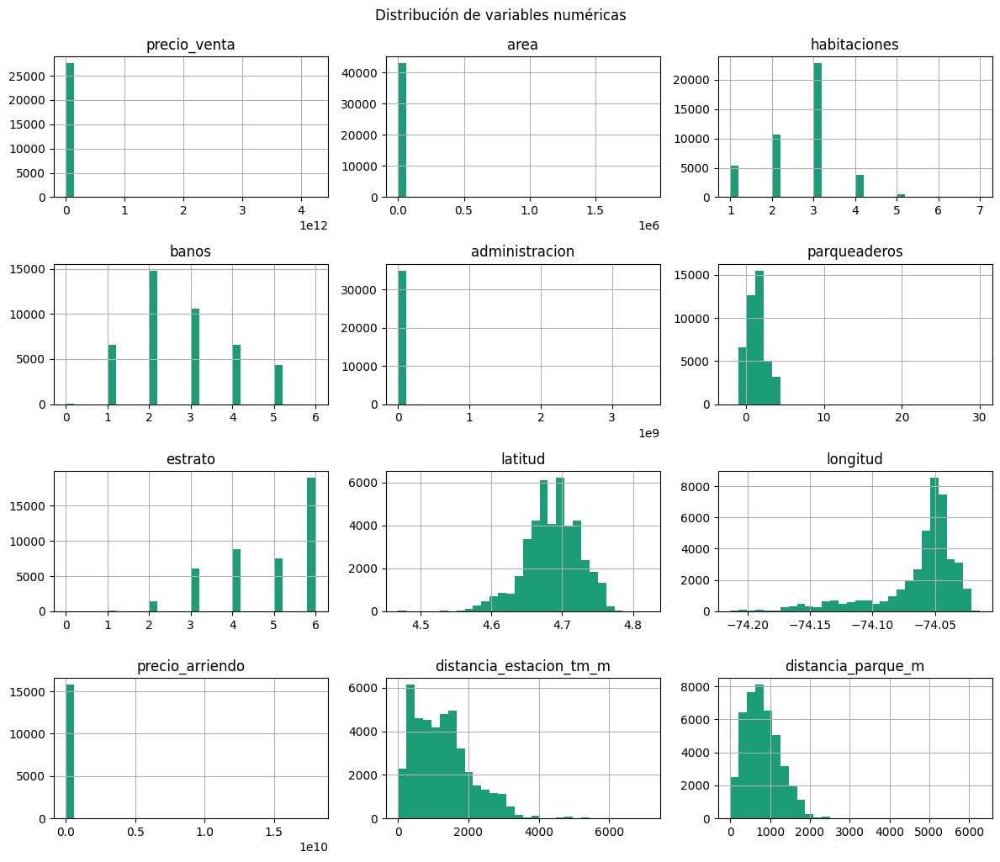

In [8]:
df[real_numerical_cols].hist(bins=30, figsize=(12,10), color='#1b9e77')
plt.tight_layout()
plt.suptitle('Distribución de variables numéricas', y=1.02)
plt.show()

Luego de ver la distribución de los datos, es posible identificar que algunas columnas  parecen presentar outliers, pues la distribución de los datos es muy asimétrica (eg. precio_venta, area, precio_arriendo).

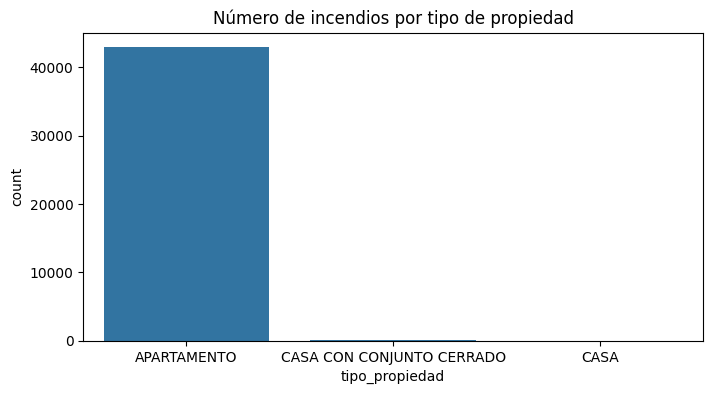

In [9]:
plt.figure(figsize=(8,4))
sns.countplot(x='tipo_propiedad', data=df)
plt.title('Número de incendios por tipo de propiedad')
plt.show()


La gráfica muestra que la columna `tipo_propiedad` tiene unas categorías altamente desbalanceadas, con una mayoría de registros correspondientes a "apartamento" mientras que las otras categorías tienen una representación mucho menor. Esta columna no aporta información relevante para el análisis.

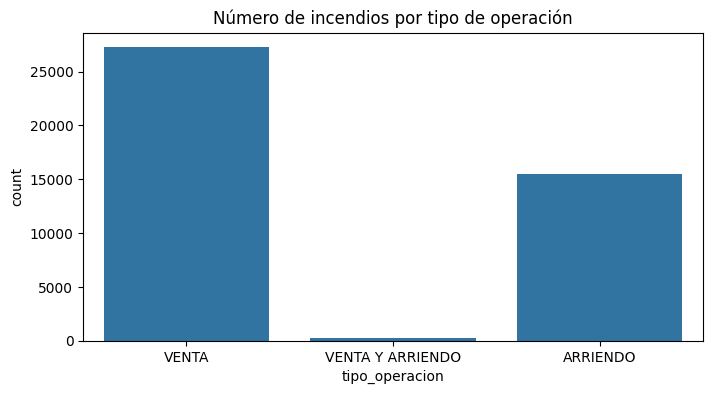

In [10]:
plt.figure(figsize=(8,4))
sns.countplot(x='tipo_operacion', data=df)
plt.title('Número de incendios por tipo de operación')
plt.show()


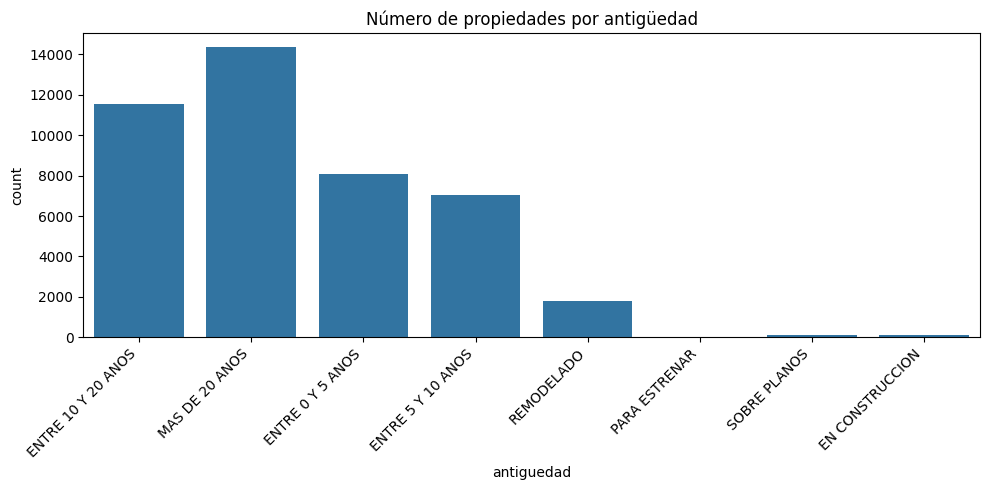

In [11]:
plt.figure(figsize=(10,5))
sns.countplot(x='antiguedad', data=df)
plt.title('Número de propiedades por antigüedad')
plt.xticks(rotation=45, ha='right')  # Rotate labels 45 degrees
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()


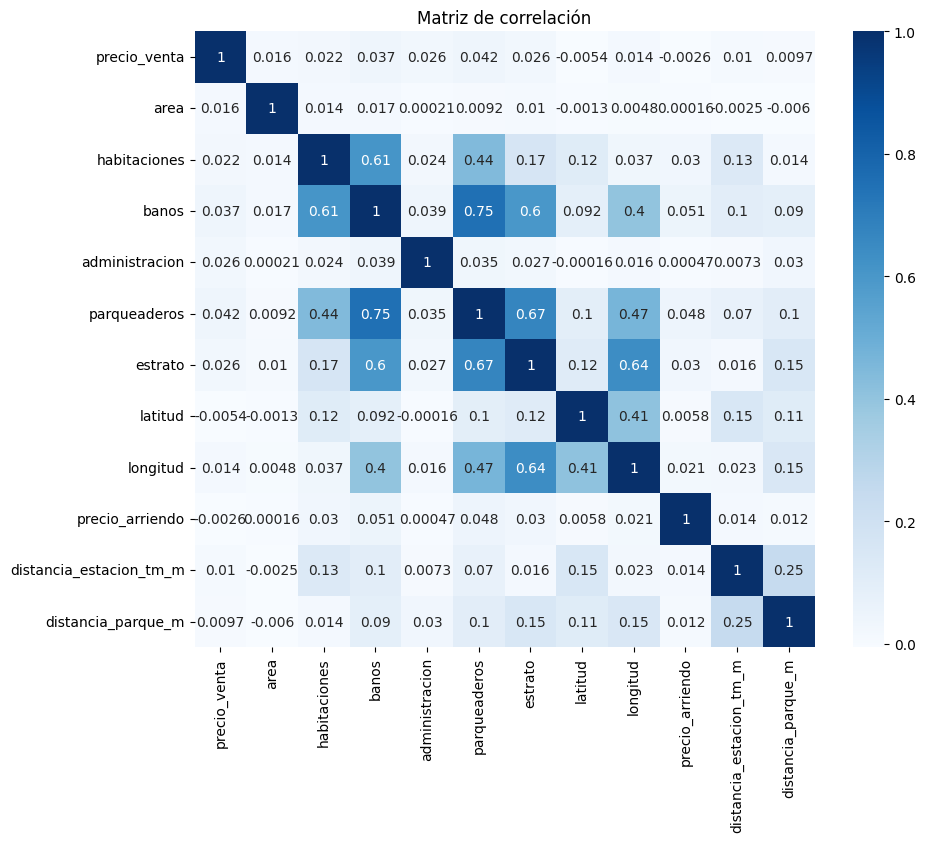

In [12]:
correlation = df[real_numerical_cols].corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation, annot=True, cmap='Blues')
plt.title('Matriz de correlación')
plt.show()

La matriz de correlación muestra relaciones fuertes entre algunas características estructurales de los inmuebles, destacándose la alta asociación entre habitaciones y baños, y entre baños y parqueaderos, lo que indica que estas variables tienden a aumentar juntas en las propiedades analizadas. También se observa una correlación relevante entre estrato y longitud, reflejando un patrón geográfico en la ubicación de los estratos. En contraste, el precio de venta presenta correlaciones bajas con la mayoría de variables.


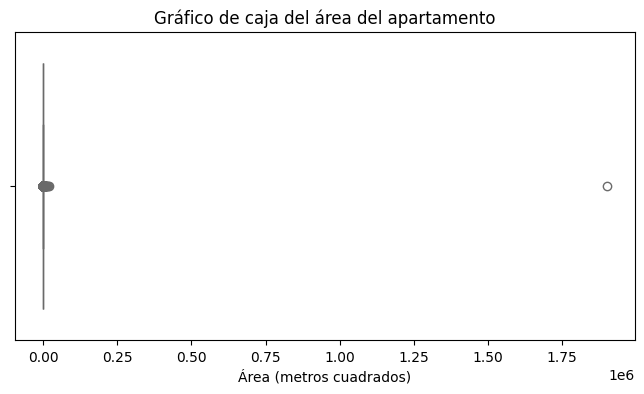

In [13]:
# Boxplot del área quemada para identificar valores atípicos
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='area', color='#ff6f61')
plt.title('Gráfico de caja del área del apartamento')
plt.xlabel('Área (metros cuadrados)')
plt.show()

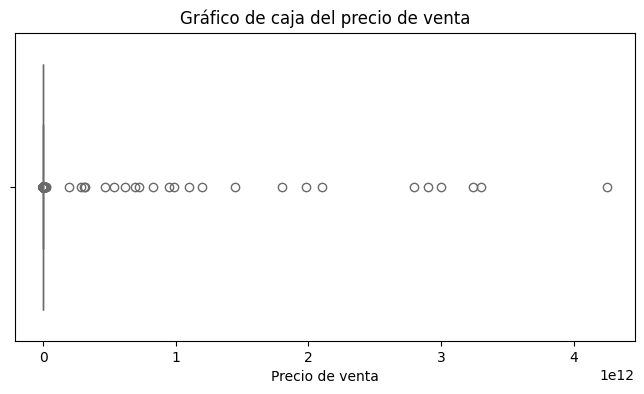

In [14]:
# Boxplot del área quemada para identificar valores atípicos
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='precio_venta', color='#ff6f61')
plt.title('Gráfico de caja del precio de venta')
plt.xlabel('Precio de venta')
plt.show()

El diagrama de caja evidencia una distribución fuertemente concentrada en valores pequeños de área y la presencia de un outlier extremo cercano a 1.8 millones de metros cuadrados, lo que indica un registro claramente atípico frente al resto de observaciones. La caja y los bigotes se mantienen muy comprimidos cerca del cero, reflejando que la mayoría de los inmuebles tienen áreas similares y sustancialmente más bajas, mientras que el punto aislado sugiere un error de captura o un valor no representativo dentro del conjunto de datos.

### 1.2. Limpieza y procesamiento de los datos

De acuerdo a lo encontrado en la exploraciónd e los datos se tomaron las siguientes decisiones de limpieza y preprocesamiento:

- Se eliminaron las columnas con valores nulos significativos (`closets`,`piso`,`url`,`direccion`).
- Se eliminarán los registros con valores nulos en columnas críticas para el análisis.
- Se hizo un tratamiento de los outliers en las columnas `precio_venta` y `area` usando el método del rango intercuartílico (IQR) para identificar y eliminar valores atípicos.


#### Tratamiento valores nulos

Eliminar columnas con muchos valores nulos. El umbral va a ser del 90% de nulos.

In [15]:
df_cleaned = df.copy()

df_cleaned = df_cleaned.loc[:, df_cleaned.isnull().mean() < 0.9]

print('Dimensiones del dataset después de eliminar columnas con muchos nulos:', df_cleaned.shape)
print('Columnas restantes:', df_cleaned.columns.tolist())
print('Columnas eliminadas:', set(df.columns) - set(df_cleaned.columns))

Dimensiones del dataset después de eliminar columnas con muchos nulos: (43013, 42)
Columnas restantes: ['_id', 'codigo', 'tipo_propiedad', 'tipo_operacion', 'precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parqueaderos', 'sector', 'estrato', 'antiguedad', 'latitud', 'longitud', 'descripcion', 'website', 'last_view', 'datetime', 'timeline', 'estado', 'compañia', 'precio_arriendo', 'jacuzzi', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'coords_modified', 'localidad', 'barrio', 'estacion_tm_cercana', 'distancia_estacion_tm_m', 'is_cerca_estacion_tm', 'parque_cercano', 'distancia_parque_m', 'is_cerca_parque']
Columnas eliminadas: {'closets', 'url', 'piso', 'direccion'}


#### Tratamiento outliers

In [16]:
# 4. Tratamiento de outliers con 'caps' en el precio de venta
lower_cap = df_cleaned['precio_venta'].quantile(0.01)
upper_cap = df_cleaned['precio_venta'].quantile(0.99)
df_cleaned['precio_venta_capped'] = df_cleaned['precio_venta'].clip(lower=lower_cap, upper=upper_cap)

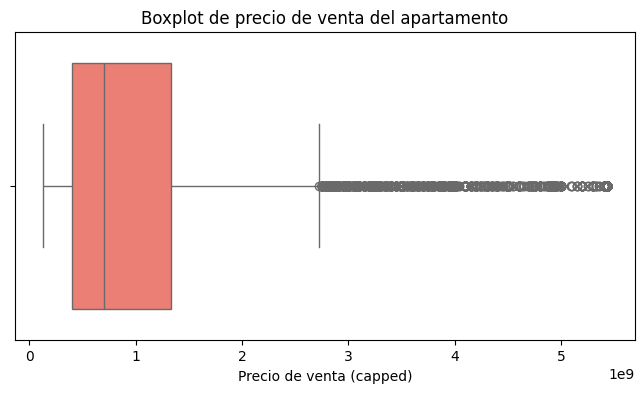

In [17]:
plt.figure(figsize=(8,4))
sns.boxplot(x=df_cleaned['precio_venta_capped'], color='#ff6f61')
plt.title('Boxplot de precio de venta del apartamento')
plt.xlabel('Precio de venta (capped)')
plt.show()

In [18]:
# 4. Tratamiento de outliers con 'caps' en el área
lower_cap = df_cleaned['area'].quantile(0.01)
upper_cap = df_cleaned['area'].quantile(0.99)
df_cleaned['area_capped'] = df_cleaned['area'].clip(lower=lower_cap, upper=upper_cap)

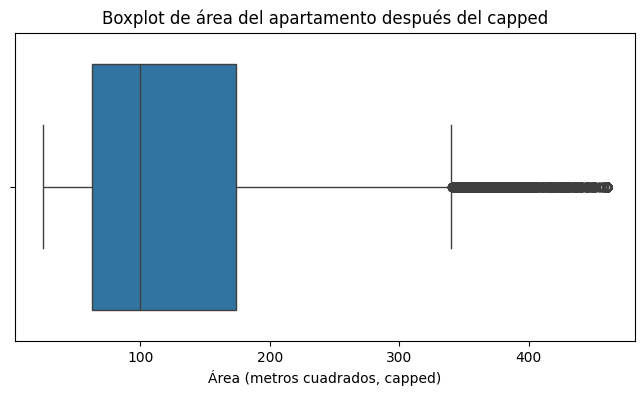

In [19]:
plt.figure(figsize=(8,4))
sns.boxplot(x=df_cleaned['area_capped'])
plt.title('Boxplot de área del apartamento después del capped')
plt.xlabel('Área (metros cuadrados, capped)')
plt.show()

Luego de hacer el tratamiento de los outliers, se observa que la distribución de las columnas `precio_venta` y `area` es más concentrada y menos dispersa, con una reducción significativa en la presencia de valores extremos. 

### 1.3. Ingeniería de características

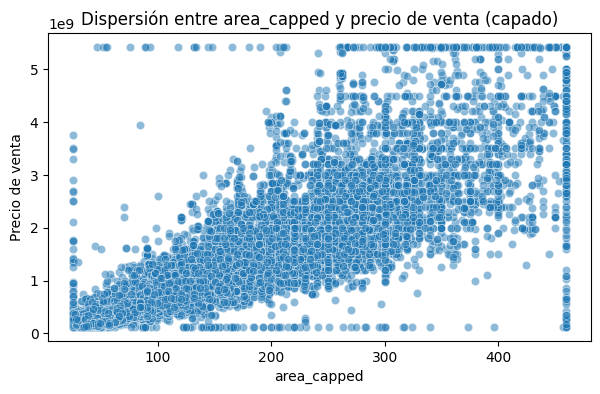

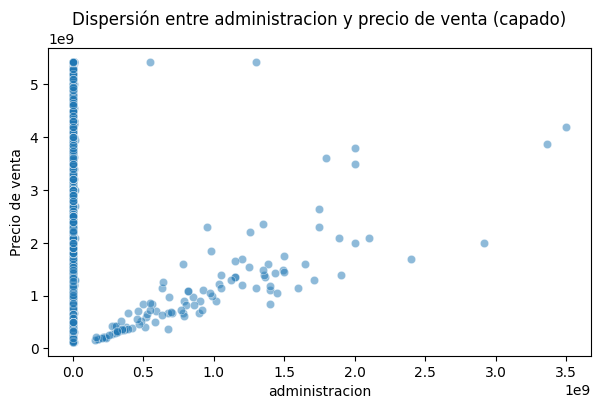

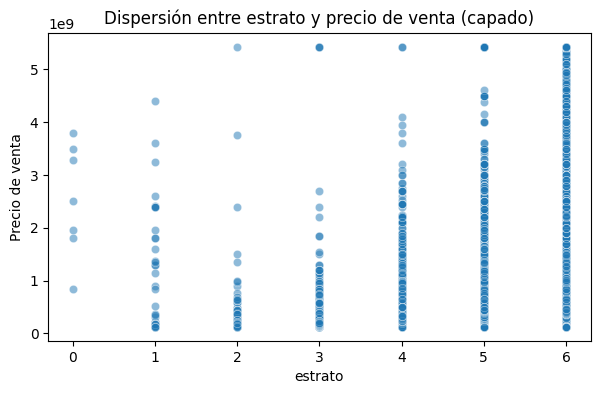

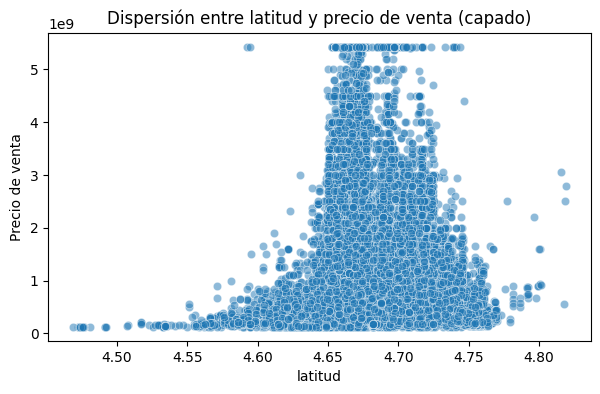

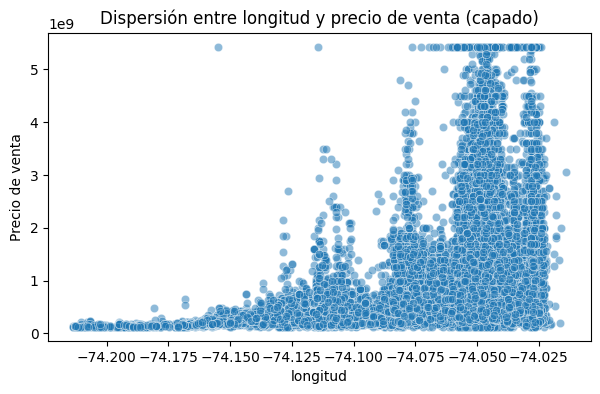

In [20]:
eval_variables = ["area_capped", "administracion", "estrato", "latitud", "longitud"]

for var in eval_variables:
    plt.figure(figsize=(7,4))
    sns.scatterplot(x=var, y='precio_venta_capped', data=df_cleaned, alpha=0.5)
    plt.title(f'Dispersión entre {var} y precio de venta (capado)')
    plt.xlabel(var)
    plt.ylabel('Precio de venta')
    plt.show()

**Decisión importante:**

Luego de realizar los análisis exploratorios y de limpieza de datos, se decidió utilizar las siguientes columnas para el modelo de regresión teniendo en cuenta su relevancia, correlación con la variable objetivo, correlación con otras variables, y la calidad de los datos:

- area_capped
- administracion
- estrato
- latitud
- longitud
- habitaciones
- banos
- parqueaderos

## 2. Entrenamiento del modelo de Machine Learning

Para la correcta evaluación del modelo es necesario guardar un conjunto de datos de validación. Para ello, se separa el 20% de los datos en un conjunto aparte. Los caps se realizan utilizando únicamente los datos de entrenamiento para evitar el data leakage.

In [21]:
def cap_outliers(df, col, caps=None):
    if caps is None:
        p1, p99 = df[col].quantile([0.01, 0.99])
        caps = (p1, p99)
    capped = df[col].clip(lower=caps[0], upper=caps[1])
    return capped, caps

La función de preprocesamiento no solo separa en las tres particiones (train, val, test), sino que también aplica todas las decisiones de preprocesamiento tomadas en la sección anterior, incluyendo el tratamiento de outliers y la imputación de valores nulos.

In [22]:
def prepare_data(df):

    # --- 1. Separar train (0.7), val (0.1), test (0.2) ---
    df_train, df_temp = train_test_split(
        df, test_size=0.3, random_state=42
    )
    df_val, df_test = train_test_split(
        df_temp, test_size=2/3, random_state=42  # 0.2 / 0.3
    )

    # --- 2. Eliminar duplicados ---
    df_train = df_train.drop_duplicates()
    df_val   = df_val.drop_duplicates()
    df_test  = df_test.drop_duplicates()

    # --- 3. Eliminar filas sin precio_venta ---
    df_train = df_train.dropna(subset=['precio_venta'])
    df_val   = df_val.dropna(subset=['precio_venta'])
    df_test  = df_test.dropna(subset=['precio_venta'])

    # --- 4. Columnas válidas (<90% NA en TRAIN) ---
    valid_columns = df_train.columns[df_train.isnull().mean() < 0.9]
    df_train = df_train[valid_columns]
    df_val   = df_val[valid_columns.intersection(df_val.columns)]
    df_test  = df_test[valid_columns.intersection(df_test.columns)]

    # --- 5. Capping en TRAIN y aplicar mismos límites en VAL/TEST ---
    df_train['precio_venta_capped'], caps_precio = cap_outliers(df_train, 'precio_venta')
    df_train['area_capped'], caps_area = cap_outliers(df_train, 'area')

    df_val['precio_venta_capped'], _ = cap_outliers(df_val, 'precio_venta', caps_precio)
    df_val['area_capped'], _ = cap_outliers(df_val, 'area', caps_area)

    df_test['precio_venta_capped'], _ = cap_outliers(df_test, 'precio_venta', caps_precio)
    df_test['area_capped'], _ = cap_outliers(df_test, 'area', caps_area)

    # --- 6. Imputaciones ---
    mean_values = df_train[['latitud', 'longitud', 'administracion', 'estrato', 'area_capped']].mean()

    for col in ['latitud', 'longitud', 'administracion', 'estrato', 'area_capped']:
        df_train[col] = df_train[col].fillna(mean_values[col])
        df_val[col]   = df_val[col].fillna(mean_values[col])
        df_test[col]  = df_test[col].fillna(mean_values[col])

    for col in ['habitaciones', 'banos', 'parqueaderos']:
        df_train[col] = df_train[col].fillna(0)
        df_val[col]   = df_val[col].fillna(0)
        df_test[col]  = df_test[col].fillna(0)

    return df_train, df_val, df_test


Es necesario estandarizar las variables numéricas y realizar el one-hot encoding de las variables categóricas para que el modelo pueda interpretarlas correctamente.

In [23]:
def encode_and_scale(df_train, df_val, df_test, numeric_cols, categorical_cols):

    X_train = df_train[numeric_cols + categorical_cols]
    X_val   = df_val[numeric_cols + categorical_cols]
    X_test  = df_test[numeric_cols + categorical_cols]

    # One-hot con train como referencia
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_val   = pd.get_dummies(X_val, drop_first=True)
    X_test  = pd.get_dummies(X_test, drop_first=True)

    # Alinear columnas
    X_val  = X_val.reindex(columns=X_train.columns, fill_value=0)
    X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

    # Escalamiento solo con train
    scaler = StandardScaler()
    X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
    X_val[numeric_cols]   = scaler.transform(X_val[numeric_cols])
    X_test[numeric_cols]  = scaler.transform(X_test[numeric_cols])

    return X_train, X_val, X_test


Finalmente, se realizan el entrenamiento y evaluación de 5 modelos de regresión: Regresión Lineal, Random Forest, Decision Tree, K-Nearest Neighbors (KNN) y XGBoost. Cada modelo es entrenado con los datos de entrenamiento y evaluado utilizando el conjunto de validación, reportando métricas clave como R², MAE y RMSE para comparar su desempeño. La idea es identificar cuál modelo ofrece la mejor capacidad predictiva para el problema planteado. Luego de esto se seleccionará el modelo de regresión lineal y el modelo que mejor desempeño tenga en validación para realizar los análisis de selección de características.

In [30]:
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

def train_models(X_train, y_train, X_test, y_test):

    models = {
        "LinearRegression": LinearRegression(),
        "RandomForest": RandomForestRegressor(n_estimators=200, random_state=42),
        "DecisionTree": DecisionTreeRegressor(
            max_depth=None,
            min_samples_split=2,
            random_state=42
        ),
        "KNN": KNeighborsRegressor(
            n_neighbors=5,
            weights='distance'
        ),
        "XGBoost": XGBRegressor(
            n_estimators=300,
            learning_rate=0.05,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            objective="reg:squarederror"
        )
    }

    results = []
    for name, model in models.items():
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        results.append({
            "model": name,
            "R2": r2_score(y_test, pred),
            "MAE": mean_absolute_error(y_test, pred),
            "RMSE": mean_squared_error(y_test, pred) ** 0.5
        })

    return pd.DataFrame(results)


Adicionalmente, se implementa una función de selección de características que permite elegir las variables más relevantes para el modelo utilizando el método de K mejores características (KBest) así como recursive feature elimination (RFE) utilizando como modelo base un XGBOOST. La idea es mejorar el rendimiento del modelo al reducir la dimensionalidad y eliminar características irrelevantes o redundantes.

In [33]:

def feature_selection(method, X, y, k=10):

    if method == 'kbest':
        selector = SelectKBest(score_func=f_regression, k=k)
        selector.fit(X, y)
        selected = X.columns[selector.get_support()]

    elif method == 'rfe':
        base_model = XGBRegressor(
            n_estimators=200,
            learning_rate=0.05,
            max_depth=4,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            objective="reg:squarederror"
        )
        selector = RFE(estimator=base_model, n_features_to_select=k, step=1)
        selector.fit(X, y)
        selected = X.columns[selector.get_support()]

    else:
        raise ValueError("Método no reconocido")

    return selected


Ahora bien, también es necesario evaluar el desempeño o el impacto de realizar el feature selection en los modelos. Para ello, se entrena y evalúa nuevamente cada modelo utilizando únicamente las características seleccionadas por el método elegido (KBest o RFE). Esto permite comparar el rendimiento de los modelos antes y después de la selección de características.

In [36]:
df_train, df_val, df_test = prepare_data(df)

numeric_cols = ["area_capped", "administracion", "estrato", "latitud", "longitud",
                "habitaciones", "banos", "parqueaderos"]

categorical_cols = ["tipo_propiedad", "antiguedad"]

X_train, X_val, X_test = encode_and_scale(df_train, df_val, df_test, numeric_cols, categorical_cols)

y_train = df_train["precio_venta_capped"]
y_val   = df_val["precio_venta_capped"]
y_test  = df_test["precio_venta_capped"]


# -----------------------------
# 1. Evaluación con TODAS las variables
# -----------------------------
print("Resultados con todas las variables:")

results_all = train_models(
    X_train,
    y_train,
    X_test,
    y_test
)

print(results_all)


# -----------------------------
# 2. Feature Selection
# -----------------------------
selected_features = feature_selection("rfe", X_train, y_train, k=12)
print("Variables seleccionadas:", list(selected_features))


# -----------------------------
# 3. Evaluación con variables seleccionadas
# -----------------------------
print("Resultados con feature selection:")

results_fs = train_models(
    X_train[selected_features],
    y_train,
    X_test[selected_features],
    y_test
)

print(results_fs)


Resultados con todas las variables:
              model        R2           MAE          RMSE
0  LinearRegression  0.793181  2.669454e+08  4.544360e+08
1      RandomForest  0.893746  1.478531e+08  3.257241e+08
2      DecisionTree  0.810357  1.931547e+08  4.351571e+08
3               KNN  0.867369  1.676072e+08  3.639158e+08
4           XGBoost  0.899900  1.533759e+08  3.161503e+08
Variables seleccionadas: ['area_capped', 'administracion', 'estrato', 'latitud', 'longitud', 'banos', 'parqueaderos', 'antiguedad_ENTRE 0 Y 5 ANOS', 'antiguedad_ENTRE 10 Y 20 ANOS', 'antiguedad_ENTRE 5 Y 10 ANOS', 'antiguedad_MAS DE 20 ANOS', 'antiguedad_REMODELADO']
Resultados con feature selection:
              model        R2           MAE          RMSE
0  LinearRegression  0.792126  2.690741e+08  4.555940e+08
1      RandomForest  0.893047  1.488069e+08  3.267932e+08
2      DecisionTree  0.812531  1.916180e+08  4.326557e+08
3               KNN  0.870769  1.650904e+08  3.592208e+08
4           XGBoost  0.8

Luego de ver los resultados obtenidos, es claro que la selección de características utilizando RFE con XGBoost como modelo base no ofrece mejoras significativas en el desempeño de los modelos. De hecho, algunos modelos muestran una ligera disminución en sus métricas de evaluación después de aplicar la selección de características. Por lo cual, se utilizarán todas las características originales para el modelo final.

Sin embargo, es claro que el mejor modelo es XGBoost con el mayor R² y el menor MAE y RMSE. Los errores no están estandarizados, con lo cual se puede interpretar que el modelo tiene un error promedio de aproximadamente del orden de 154'263'600 COP.

## 3. Análisis cuantitativo de resultados

In [39]:
results_fs = train_models(
    X_train[selected_features],
    y_train,
    X_val[selected_features],
    y_val
)

results_copy = results_fs.copy()
results_copy['MAE'] = results_fs['MAE'].apply(lambda x: "${:,.0f} COP".format(x))
results_copy['RMSE'] = results_fs['RMSE'].apply(lambda x: "${:,.0f} COP".format(x))
print(results_copy)


              model        R2               MAE              RMSE
0  LinearRegression  0.796103  $273,033,030 COP  $446,774,785 COP
1      RandomForest  0.888292  $153,732,514 COP  $330,693,579 COP
2      DecisionTree  0.809778  $199,207,911 COP  $431,532,138 COP
3               KNN  0.867900  $170,128,301 COP  $359,612,602 COP
4           XGBoost  0.893561  $158,537,423 COP  $322,800,153 COP


Los modelos evaluados muestran diferencias importantes en su capacidad para estimar precios de vivienda. En términos generales, las métricas de R², MAE y RMSE permiten entender qué tan bien se ajusta cada algoritmo al comportamiento real del mercado. El R² indica qué proporción de la variabilidad del precio está siendo explicada por el modelo, mientras que el MAE y el RMSE expresan el error promedio y el impacto de errores grandes, respectivamente, en pesos colombianos. Al revisar los resultados, XGBoost y Random Forest son los modelos que ofrecen las mejores predicciones, alcanzando niveles de ajuste superiores al 0.88 y errores promedio entre 150 y 160 millones COP, lo que representa una mejora significativa frente a los métodos lineales.

Aunque un MAE cercano a 155 millones COP sigue siendo un margen considerable, el modelo cumple con el objetivo de HabitAlpes de entregar una estimación inicial razonable del valor de un apartamento. El mercado inmobiliario es altamente variable y depende de factores difíciles de capturar con precisión absoluta, por lo que un modelo que ya localiza el precio en una zona cercana al valor real aporta información útil para orientar el trabajo del perito. En lugar de reemplazar completamente la revisión humana, la herramienta actúa como un apoyo para reducir tiempos, estandarizar criterios y ofrecer al cliente una referencia competitiva basada en propiedades similares.

En términos generales, los resultados muestran un avance significativo hacia la automatización del proceso y evidencian que modelos basados en ensambles, como XGBoost, se ajustan bien al comportamiento real de los precios de vivienda y constituyen una base adecuada para seguir refinando la herramienta.


## 4. Análisis cualitativo de resultados

### 4.1. XGBoost

In [47]:
X_train = X_train.astype(float)
X_test = X_test.astype(float)


PermutationExplainer explainer: 5542it [07:50, 11.52it/s]                          


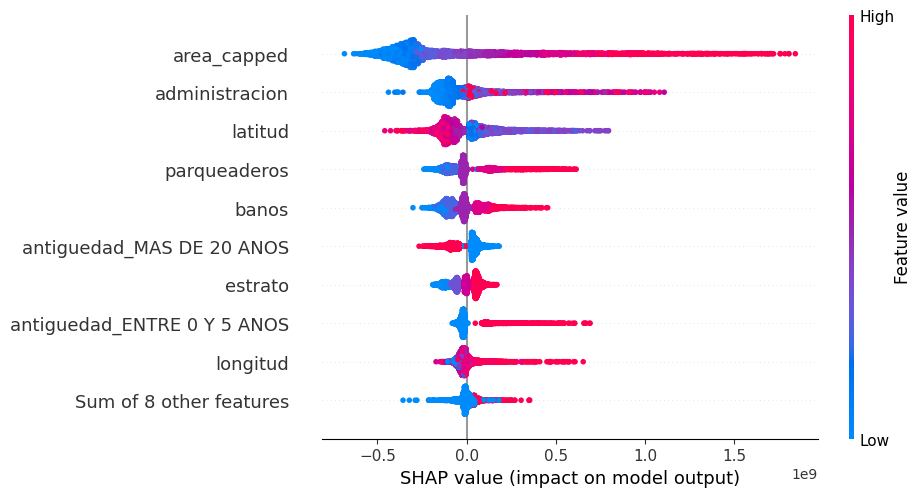

In [61]:
model_xgb = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42
)

model_xgb.fit(X_train, y_train)

# Create masker from the DataFrame (keeps names)
masker = shap.maskers.Independent(X_train)

# Use model.predict (this avoids the TreeExplainer bug)
explainer = shap.Explainer(model_xgb.predict, masker)

# Compute SHAP values
shap_values = explainer(X_test)

# Plot with REAL feature names
shap.plots.beeswarm(shap_values)



In [59]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
from IPython.display import display, HTML
# Crear el explicador con tus datos de entrenamiento
lime_explainer = LimeTabularExplainer(
    training_data=X_train.to_numpy(),
    feature_names=X_train.columns.tolist(),
    mode='regression'
)

# Observación que quieres explicar
sample_idx = 16

# Explicación usando el modelo deseado
for i in [5, 20, 33]:
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_xgb.predict,
        num_features=10
    )
    display(HTML(exp.as_html()))


### 4.2. Regresión Lineal

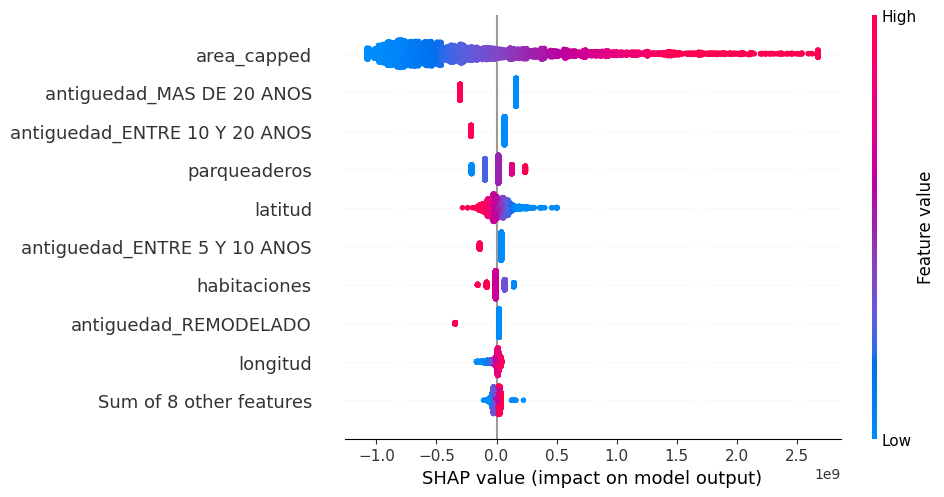

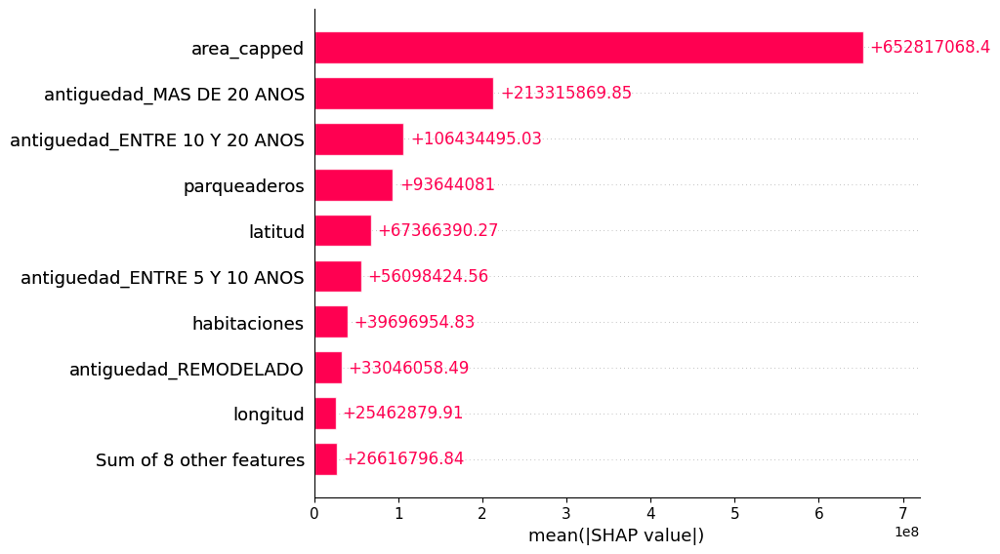

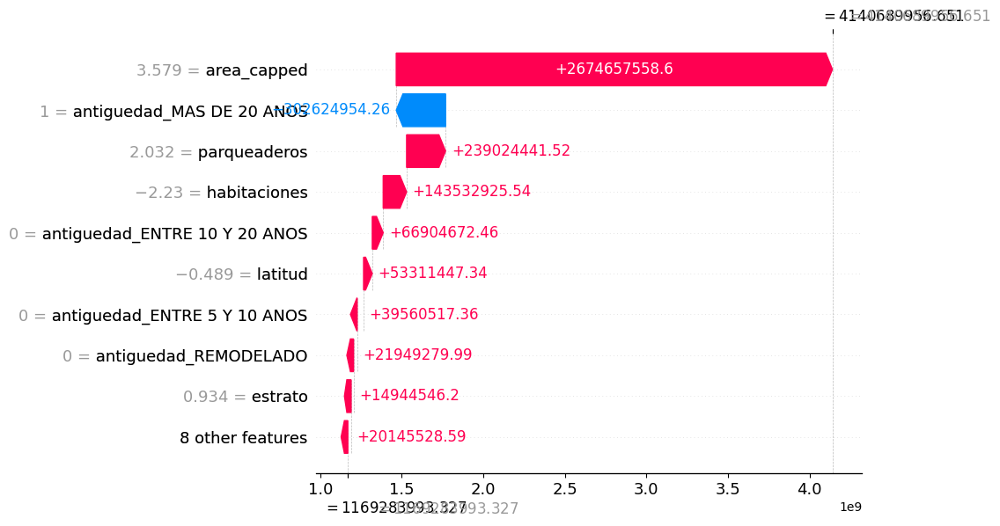

In [ ]:

# Entrenar el modelo lineal
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

# Explicador SHAP universal
explainer_lr = shap.Explainer(model_lr, X_train)

# SHAP values
shap_values_lr = explainer_lr(X_test)

# --- Interpretación global ---
shap.plots.beeswarm(shap_values_lr)

# Importancia ordenada ---
shap.plots.bar(shap_values_lr)

# --- Explicación local ---
shap.plots.waterfall(shap_values_lr[5])


In [60]:

# Crear el explicador con tus datos de entrenamiento
lime_explainer = LimeTabularExplainer(
    training_data=X_train.to_numpy(),
    feature_names=X_train.columns.tolist(),
    mode='regression'
)

# Observación que quieres explicar
sample_idx = 16

# Explicación usando el modelo deseado
for i in [5, 20, 33]:
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_lr.predict,
        num_features=10
    )
    display(HTML(exp.as_html()))



## 5. Generación de valor

## 6. Insights